<a href="https://colab.research.google.com/github/niopeng/CHIMLE/blob/main/Demo/CHIMLE_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Conditional Hierarchical IMLE

This is a guide to Conditional Hierarchical IMLE (CHIMLE), a general-purpose conditional image synthesis method based on [Implicit Maximum Likelihood Estimation (IMLE)](https://arxiv.org/abs/1809.09087). This notebook focuses on the task of colourization, while other image-to-image translation tasks such as super-resolution, image decompression and night-to-day can be found in our official code [here](https://github.com/niopeng/CHIMLE/tree/main/code). For a more in-depth understanding of the method, please refer to our paper:

Shichong Peng, Alireza Moazeni, Ke Li. "[CHIMLE: Conditional Hierarchical IMLE for Multimodal Conditional Image Synthesis.](https://arxiv.org/abs/2211.14286)" Neural Information Processing Systems (NeurIPS 2022)

# Model

In [ ]:
#@title Define Model Architecture: Tower Implicit Model (TIM) (double click to expand or collapse)

import torch.nn as nn
from torch.nn.utils import weight_norm

from collections import OrderedDict


def act(act_type, inplace=True, neg_slope=0.2):
    act_type = act_type.lower()
    if act_type == 'leakyrelu':
        layer = nn.LeakyReLU(neg_slope, inplace)
    elif act_type == 'tanh':
        layer = nn.Tanh()
    else:
        raise NotImplementedError('activation layer [{:s}] is not found'.format(act_type))
    return layer

def conv_block(in_nc, out_nc, kernel_size, dilation=1, bias=True, pad_type='zero', act_type='leakyrelu'):
    padding = get_valid_padding(kernel_size, dilation)
    padding = padding if pad_type == 'zero' else 0
    c = weight_norm(nn.Conv2d(in_nc, out_nc, kernel_size=kernel_size, padding=padding, dilation=dilation, bias=bias),
                    name='weight')
    a = act(act_type) if act_type else None
    return sequential(c, a)

def get_valid_padding(kernel_size, dilation):
    kernel_size = kernel_size + (kernel_size - 1) * (dilation - 1)
    padding = (kernel_size - 1) // 2
    return padding

def upconv_block(in_nc, out_nc, upscale_factor=2, kernel_size=3, bias=True, pad_type='zero', act_type='leakyrelu',
                 mode='nearest'):
    upsample = nn.Upsample(scale_factor=upscale_factor, mode=mode)
    conv = conv_block(in_nc, out_nc, kernel_size, bias=bias, pad_type=pad_type, act_type=act_type)
    return sequential(upsample, conv)

class ResidualDenseBlock(nn.Module):
    '''
    Residual Dense Block
    style: 5 convs
    The core module of paper: (Residual Dense Network for Image Super-Resolution, CVPR 18)
    '''

    def __init__(self, nc, kernel_size=3, gc=32, bias=True, pad_type='zero', act_type='leakyrelu'):
        super(ResidualDenseBlock, self).__init__()
        # gc: growth channel, i.e. intermediate channels
        self.conv1 = conv_block(nc, gc, kernel_size, bias=bias, pad_type=pad_type, act_type=act_type)
        self.conv2 = conv_block(nc + gc, gc, kernel_size, bias=bias, pad_type=pad_type, act_type=act_type)
        self.conv3 = conv_block(nc + 2 * gc, gc, kernel_size, bias=bias, pad_type=pad_type, act_type=act_type)
        self.conv4 = conv_block(nc + 3 * gc, gc, kernel_size, bias=bias, pad_type=pad_type, act_type=act_type)
        self.conv5 = conv_block(nc + 4 * gc, nc, 3, bias=bias, pad_type=pad_type, act_type=None)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(torch.cat((x, x1), 1))
        x3 = self.conv3(torch.cat((x, x1, x2), 1))
        x4 = self.conv4(torch.cat((x, x1, x2, x3), 1))
        x5 = self.conv5(torch.cat((x, x1, x2, x3, x4), 1))
        return x5.mul(0.2) + x

class RRDB(nn.Module):
    '''
    Residual in Residual Dense Block
    (ESRGAN: Enhanced Super-Resolution Generative Adversarial Networks)
    '''

    def __init__(self, nc, kernel_size=3, gc=32, bias=True, pad_type='zero', act_type='leakyrelu'):
        super(RRDB, self).__init__()
        self.RDB1 = ResidualDenseBlock(nc, kernel_size, gc, bias, pad_type, act_type)
        self.RDB2 = ResidualDenseBlock(nc, kernel_size, gc, bias, pad_type, act_type)
        self.RDB3 = ResidualDenseBlock(nc, kernel_size, gc, bias, pad_type, act_type)

    def forward(self, x):
        out = self.RDB1(x)
        out = self.RDB2(out)
        out = self.RDB3(out)
        return out.mul(0.2) + x

    
def sequential(*args):
    # Flatten Sequential. It unwraps nn.Sequential.
    if len(args) == 1:
        if isinstance(args[0], OrderedDict):
            raise NotImplementedError('sequential does not support OrderedDict input.')
        return args[0]  # No sequential is needed.
    modules = []
    for module in args:
        if isinstance(module, nn.Sequential):
            for submodule in module.children():
                modules.append(submodule)
        elif isinstance(module, nn.Module):
            modules.append(module)
    return nn.Sequential(*modules)


class ShortcutBlock(nn.Module):
    # Elementwise sum the output of a submodule to its input
    def __init__(self, submodule):
        super(ShortcutBlock, self).__init__()
        self.sub = submodule

    def forward(self, x, extra_x=None):
        if extra_x is None:
            output = x + self.sub(x)
        else:
            output = x + self.sub(x, extra_x)
        return output

    def __repr__(self):
        tmpstr = 'Identity + \n|'
        modstr = self.sub.__repr__().replace('\n', '\n|')
        tmpstr = tmpstr + modstr
        return tmpstr


class StyleBlock(nn.Module):
    '''
    Style Block: Rescale each RRDB output
    '''

    def __init__(self, rrdbs, transformations, lr_conv):
        super(StyleBlock, self).__init__()
        assert len(rrdbs) == len(transformations)
        self.nb = len(rrdbs)
        for i, rrdb in enumerate(rrdbs):
            self.add_module("%d" % i, rrdb)
            self.add_module("transform_%d" % i, transformations[i])
        self.lr_conv = lr_conv

    def forward(self, x, x_feat):
        for i in range(self.nb):
            rrdb_out = getattr(self, "%d" % i)(x)
            tran_out = getattr(self, "transform_%d" % i)(x_feat)
            bs, nc, w, h = rrdb_out.shape
            norm_layer = nn.InstanceNorm2d(nc, affine=False)
            x = (1. + tran_out[:, :nc].reshape(bs, nc, 1, 1)).expand(bs, nc, w, h) * norm_layer(rrdb_out) + \
                tran_out[:, nc:].reshape(bs, nc, 1, 1).expand(bs, nc, w, h)
        out = self.lr_conv(x)
        return out


class TIM(nn.Module):
    def __init__(self, in_nc, code_nc, out_nc, num_residual_channels, num_dense_channels, num_blocks, num_levels=3,
                 act_type='leakyrelu', upsample_kernel_mode="nearest", feat_scales=None, latent_nc=512):
        super(TIM, self).__init__()
        self.num_levels = num_levels
        self.code_nc = code_nc
        self.feat_scales = feat_scales if feat_scales is not None else [0.1] * (self.num_levels - 1)

        for i in range(self.num_levels):
            cur_num_dc = num_dense_channels[i]
            cur_num_rc = num_residual_channels[i]

            # mapping network
            mapping_net = [sequential(nn.Linear(code_nc, latent_nc), act(act_type))]
            for _ in range(7):
                mapping_net.append(sequential(nn.Linear(latent_nc, latent_nc), act(act_type)))
            self.add_module("level_%d_map" % (i + 1), sequential(*mapping_net))

            if i == 0:
                fea_conv = conv_block(in_nc, cur_num_rc, kernel_size=3, act_type=None)
            else:
                fea_conv = conv_block(in_nc + num_residual_channels[i - 1], cur_num_rc, kernel_size=3,
                                        act_type=None)

            # RRDB blocks
            rb_blocks = [RRDB(cur_num_rc, kernel_size=3, gc=cur_num_dc, bias=True, pad_type='zero',
                                act_type=act_type) for _ in range(num_blocks)]
            transformations = [nn.Linear(latent_nc, 2 * cur_num_rc) for _ in range(num_blocks)]
            lr_conv = conv_block(cur_num_rc, cur_num_rc, kernel_size=3, act_type=None)
            style_block = StyleBlock(rb_blocks, transformations, lr_conv)
            hr_conv = conv_block(cur_num_rc, cur_num_rc, kernel_size=3, act_type=act_type)
            out_conv = conv_block(cur_num_rc, out_nc, kernel_size=3, act_type="tanh")
            
            if i == self.num_levels - 1:
                layer = conv_block(cur_num_rc, cur_num_rc, kernel_size=3, act_type=act_type)
            else:
                layer = upconv_block(cur_num_rc, cur_num_rc, act_type=act_type, mode=upsample_kernel_mode)
            

            self.add_module("level_%d_feat" % (i + 1), fea_conv)
            self.add_module("level_%d_style" % (i + 1), ShortcutBlock(style_block))
            self.add_module("level_%d_up" % (i + 1), sequential(layer, hr_conv))
            self.add_module("level_%d_out" % (i + 1), out_conv)

    def forward(self, net_input, codes):
        assert len(codes) <= self.num_levels, "Number of codes should be no more than number of level of the network"
        outputs = []
        feature = None
        for i, code in enumerate(codes):
            x = net_input[i] if i == 0 else torch.cat((net_input[i], feature * self.feat_scales[i - 1]), dim=1)
            map_feature = getattr(self, "level_%d_map" % (i + 1))(code)
            feature = getattr(self, "level_%d_feat" % (i + 1))(x)
            feature = getattr(self, "level_%d_style" % (i + 1))(feature, map_feature)
            if i == self.num_levels - 1:
                feature = getattr(self, "level_%d_up" % (i + 1))(feature)
            out = getattr(self, "level_%d_out" % (i + 1))(feature)

            if i < self.num_levels - 1:
                feature = getattr(self, "level_%d_up" % (i + 1))(feature)

            outputs.append(out)

        for i in range(0, len(outputs)):
            outputs[i] = torch.cat((net_input[i], outputs[i]), 1)
        return outputs

In [ ]:
#@title Define util functions (double click to expand or collapse)

def xyz2rgb(xyz):
    r = 3.24048134 * xyz[:, 0, :, :] - 1.53715152 * xyz[:, 1, :, :] - 0.49853633 * xyz[:, 2, :, :]
    g = -0.96925495 * xyz[:, 0, :, :] + 1.87599 * xyz[:, 1, :, :] + .04155593 * xyz[:, 2, :, :]
    b = .05564664 * xyz[:, 0, :, :] - .20404134 * xyz[:, 1, :, :] + 1.05731107 * xyz[:, 2, :, :]

    rgb = torch.cat((r[:, None, :, :], g[:, None, :, :], b[:, None, :, :]), dim=1)
    rgb = torch.max(rgb, torch.zeros_like(rgb))  # sometimes reaches a small negative number, which causes NaNs

    mask = (rgb > .0031308).type(torch.FloatTensor)
    if rgb.is_cuda:
        mask = mask.cuda()

    rgb = (1.055 * ((rgb + 1e-12) ** (1. / 2.4)) - 0.055) * mask + 12.92 * rgb * (1 - mask)

    return rgb


def lab2xyz(lab):
    y_int = (lab[:, 0, :, :] + 16.) / 116.
    x_int = (lab[:, 1, :, :] / 500.) + y_int
    z_int = y_int - (lab[:, 2, :, :] / 200.)

    if z_int.is_cuda:
        z_int = torch.max(torch.Tensor((0,)).cuda(), z_int)
    else:
        z_int = torch.max(torch.Tensor((0,)), z_int)

    out = torch.cat((x_int[:, None, :, :], y_int[:, None, :, :], z_int[:, None, :, :]), dim=1)
    mask = (out > .2068966).type(torch.FloatTensor)
    if out.is_cuda:
        mask = mask.cuda()

    out = (out ** 3.) * mask + (out - 16. / 116.) / 7.787 * (1 - mask)

    sc = torch.Tensor((0.95047, 1., 1.08883))[None, :, None, None]
    sc = sc.to(out.device)

    out = out * sc
    return out


def lab2rgb_tensor(lab_tensor):
    """
    Parameter:
        lab_tensor : a 4D torch.Tensor instance, shape = (B, C, H, W)
        Accepted range for LAB: L = [0, 1] and AB = [-1, 1]
        network_opt : contains information needs for converting
    Return
        rgb_tensor : the input tensor in LAB colour space, shape = (B, C, H, W)
        Output range : [0, 1]
    Explanation:
        convert the input tensors from LAB colour space to RGB colour space
    """
    l_tmp = lab_tensor[:, [0], :, :]
    a_tmp = lab_tensor[:, [1], :, :]
    b_tmp = lab_tensor[:, [2], :, :]
    if l_tmp.is_cuda:
        l_tmp_d = torch.max(torch.Tensor((0.01,)).cuda(), l_tmp)
    else:
        l_tmp_d = torch.max(torch.Tensor((0.01,)), l_tmp)
    a_tmp /= l_tmp_d
    b_tmp /= l_tmp_d
    l_tmp = l_tmp_d * 100.
    a_tmp = a_tmp * 127.
    b_tmp = b_tmp * 127.
    lab_tmp = torch.cat((l_tmp, a_tmp, b_tmp), dim=1)
    return xyz2rgb(lab2xyz(lab_tmp))

# Data Loading

In [ ]:
#@title Download [NCD](https://arxiv.org/abs/2008.10774v3) Dataset (double click to expand or collapse)
import os, sys
os.system("pip install onedrivedownloader")
from onedrivedownloader import download
ln = "https://1sfu-my.sharepoint.com/:u:/g/personal/spa176_sfu_ca/Ec4v9yT3cHpMlVEszRenj_IB7R-PfZSGQdp_lNGOO0AtgA?e=CPzxuO"

download(ln, filename="NCD_128.zip", unzip=True, unzip_path="./")

100%|██████████| 15.7M/15.7M [00:01<00:00, 9.41MiB/s]


Unzipping file...


Extracting files: 100%|██████████| 9/9 [00:00<00:00, 45.76it/s]


'./'

In [ ]:
#@title Define Dataset Class (double click to expand or collapse)

import torch
import torch.utils.data as data
from torch.utils.data import DataLoader, Dataset, Subset
import os
import lmdb
import pickle
import numpy as np
import cv2
import PIL
from PIL import Image
from skimage import color


def get_image_paths(dataroot):
    env = lmdb.open(dataroot, readonly=True, lock=False, readahead=False, 
                    meminit=False)
    keys_cache_file = os.path.join(dataroot, '_keys_cache.p')
    if os.path.isfile(keys_cache_file):
        print('read lmdb keys from cache: {}'.format(keys_cache_file))
        keys = pickle.load(open(keys_cache_file, "rb"))
    else:
        with env.begin(write=False) as txn:
            print('creating lmdb keys cache: {}'.format(keys_cache_file))
            keys = [key.decode('ascii') for key, _ in txn.cursor()]
        pickle.dump(keys, open(keys_cache_file, 'wb'))
    paths = sorted([key for key in keys if not key.endswith('.meta')])
    return env, paths


def read_img(env, path):
    with env.begin(write=False) as txn:
        buf = txn.get(path.encode('ascii'))
        buf_meta = txn.get((path + '.meta').encode('ascii')).decode('ascii')
    img_flat = np.frombuffer(buf, dtype=np.uint8)
    H, W, C = [int(s) for s in buf_meta.split(',')]
    img = img_flat.reshape(H, W, C)
    img = img.astype(np.float32) / 255.
    return img


def downsample_PIL(rgb_img, scale):
    """
    :param rgb_img: input image is a NumPy array, [0, 1], RGB, HWC
    :param scale: the scaling factor
    :return: a NumPy array, [0, 1], np.float32, RGB, HWC
    """
    inp_rgb = Image.fromarray(np.uint8(rgb_img * 255.))
    transformed = np.array(inp_rgb.resize((int(inp_rgb.size[0] * scale), 
                                           int(inp_rgb.size[1] * scale)),
                                           resample=PIL.Image.BICUBIC), 
                           dtype=np.float32)
    transformed /= 255.
    return transformed


class ColourizationDataset(data.Dataset):
    '''
    Given target coloured images, generates gray-scale input and intermediate 
    resolution images on-the-fly.
    '''

    def __init__(self, path, max_len=-1):
        super(ColourizationDataset, self).__init__()
        self.HR_Color_env, self.paths_HR_Color = get_image_paths(path)
        if max_len > 0:
            self.paths_HR_Color = self.paths_HR_Color[:max_len]
        assert self.paths_HR_Color, 'Error: Target image folder path is empty.'

    def __getitem__(self, index):
        # get HR_Color image
        HR_path = self.paths_HR_Color[index]
        img_HR_rgb = cv2.cvtColor(read_img(self.HR_Color_env, HR_path), 
                                  cv2.COLOR_BGR2RGB)  # HWC, BGR, [0,1], 128*128
        # down-sampling on-the-fly
        # HWC, RGB, [0, 1]
        y1_rgb = downsample_PIL(img_HR_rgb, scale=1. / 4)  # 32*32
        y2_rgb = downsample_PIL(img_HR_rgb, scale=1. / 2)  # 64*64
        
        # input L channels scaled to range [0, 1]
        x3 = torch.Tensor(color.rgb2lab(img_HR_rgb)[:, :, 0] / 100.0)[None, :, :]
        x1 = torch.Tensor(color.rgb2lab(y1_rgb)[:, :, 0] / 100.0)[None, :, :]
        x2 = torch.Tensor(color.rgb2lab(y2_rgb)[:, :, 0] / 100.0)[None, :, :]

        # HWC to CHW, numpy to tensor
        y3 = torch.from_numpy(np.ascontiguousarray(np.transpose(img_HR_rgb, (2, 0, 1)))).float()
        y1 = torch.from_numpy(np.ascontiguousarray(np.transpose(y1_rgb, (2, 0, 1)))).float()
        y2 = torch.from_numpy(np.ascontiguousarray(np.transpose(y2_rgb, (2, 0, 1)))).float()

        return {
                'network_input': [x1, x2, x3],
                'y1': y1,
                'y2': y2,
                'y3': y3
                }

    def __len__(self):
        return len(self.paths_HR_Color)

# Conditional Hierarchical IMLE (CHIMLE) Algorithm

In conditional image synethesis, we want to learn a model $f_{\theta}$ that maps the input $x$ to an observed image $y$. To allow multimodal synthesis, we add a latent random variable $z$ as an input. i.e., $f_{\theta}(x, z)$.

[Conditional IMLE (cIMLE)](https://arxiv.org/abs/2004.03590) is an extension of [IMLE](https://arxiv.org/abs/1809.09087) to the conditional setting, and the objective function takes the following form:

$$\min_{\theta}\mathbb{E}_{\mathbf{z}^{(1,1)},\ldots,\mathbf{z}^{(n,m)} \sim \mathcal{N}(0, \mathbf{I})}\left[\sum_{i=1}^{n}\min_{j\in \{1,\ldots,m\}}d(f_{\theta}(\mathbf{x}^{(i)}, \mathbf{z}^{(i,j)}), \mathbf{y}^{(i)})\right]$$

where $d(\cdot,\cdot)$ is a distance metric, $m$ is a hyperparameter, and $\mathbf{x}^{(i)}$ and $\mathbf{y}^{(i)}$ are the $i^{\text{th}}$ input and observed image in the dataset. 

To train $f_\theta$ using the objective above, the algorithm solves a sequence of optimization problems. In each problem (referred as "round" in the code below), the algorithm first generates a *pool* of $m$ samples from $f_\theta$ for each input $\mathbf{x}^{(i)}$, it then selects the *closest* sample for each observed image $\mathbf{y}^{(i)}$ and optimizes $\theta$ for a number of epochs.

To generate high-fidelity images, cIMLE requires *many samples* (a large $m$). Doing so is expensive, and so this limits image fidelity in practice. Our proposed method, **CHIMLE**, uses a hierarchical sampling algorithm that efficiently searches for a “*good*” sample as if it was selected from a large pool of samples.

**Step 1**: Divide the latent code $z$ into $L$ components, each operating at a different resolution.

![step1](https://github.com/niopeng/CHIMLE/blob/main/Demo/step1.png?raw=true)

**Step 2**: Select the value for each code component that produces the intermediate output closest to the observed image (downsampled to the same resolution) from a pool of $k$ samples.

![step2](https://github.com/niopeng/CHIMLE/blob/main/Demo/step2.png?raw=true)

**Step 3**: Construct the full latent code from the code component starting at the lowest resolution
and fix the selected value for lower resolutions before moving on to a higher resolution.

![step3](https://github.com/niopeng/CHIMLE/blob/main/Demo/step3.png?raw=true)

In [ ]:
#@title CHIMLE Implementation (double click to expand or collapse)

import tqdm
from tqdm.notebook import tqdm


device = torch.device("cuda") if torch.cuda.is_available() else torch.device('cpu')


class ImageLatentDataset(data.Dataset):

    def __init__(self, dataset, latents):
        super(ImageLatentDataset, self).__init__()
        self.dataset = dataset
        self.latents = [latent.cpu() for latent in latents]
    
    def __len__(self): return len(self.dataset)

    def __getitem__(self, idx):
        data = self.dataset[idx]
        return data['network_input'], [latent[idx] for latent in self.latents], data['y3']

    @staticmethod
    def get_image_latent_dataset(model, loss_fn, dataset, code_nc, L, k=10, bs=128, noise_fn=torch.randn):
        """Returns an ImageLatentDataset giving noised images and codes for
        [model] to use in CHIMLE training. The corresponding notations used in
        Algorithm 1 of the paper is shown in quotes.
        Args:
        model       -- generator model "f_theta"
        loss_fn     -- distance metric "d(,)"
        dataset     -- dataset of inputs "{x_l}" and observed images "{y_l}"
        code_nc     -- number of channels for each latent code "z"
        L           -- number of resolutions 
        k           -- number of samples to generate for each obseved image
        bs          -- mini batch size for generating samples
        noise_fn    -- function to generate random latent noise
        """
        with torch.no_grad():
            selected_zs = []
            # start from the lowest resolution (level) to the highest resolution (level)
            for level in range(L):
                # initialize the best losses and index to the corresponding latent codes at current resolution
                least_losses = torch.ones(len(dataset), device=device) * float("inf")
                best_latents = torch.zeros(len(dataset), code_nc, device=device)
                
                loader = DataLoader(dataset, batch_size=int(bs), shuffle=False, pin_memory=True)
                
                for idx,data in tqdm(enumerate(loader),
                    desc="Level %d Sampling outer loop" % (level + 1),
                    total=len(loader),
                    leave=False,
                    dynamic_ncols=True):
                    # sample a mini-batch of conditioning input to fit in memory
                    start_idx = idx * bs
                    stop_idx = min(start_idx + bs, len(dataset))
                    # select the conditioning inputs
                    inputs = [input.to(device, non_blocking=True) 
                                for input in data['network_input']]
                    # select the corresponding (downsampled if not the last level) targets at the current resolution
                    targets = data['y%d'%(level + 1)].to(device, non_blocking=True)
                    # fix the previously selected latent codes at lower resolutions for each conditioning input
                    cur_batch_selected_z = [selected_z[start_idx:stop_idx, :].to(device, non_blocking=True) 
                                            for selected_z in selected_zs]
                    # repeatly generate k samples per conditioning input and find the latent code for the best sample 
                    for sample_idx in tqdm(range(k),
                        desc="Level %d Sampling inner loop" % (level + 1),
                        leave=False,
                        dynamic_ncols=True):
                        # draw a latent code to produce a new sample
                        z = noise_fn(len(targets), code_nc, device=device)
                        outputs = model(inputs, cur_batch_selected_z + [z])
                        rgb_out = lab2rgb_tensor(outputs[-1])
                        # partial evaluation: evaluate the distance from the current sample to the target
                        losses = loss_fn(rgb_out, targets)
                        losses = torch.sum(losses.view(len(targets), -1), dim=1)
                        # find whether the current sample is closer to the observed image (target)
                        change_idxs = (losses < least_losses[start_idx:stop_idx])
                        least_losses[start_idx:stop_idx][change_idxs] = losses[change_idxs]
                        best_latents[start_idx:stop_idx][change_idxs] = z[change_idxs]
                # add the selected latent code of the current resolution
                selected_zs.append(best_latents.cpu())
        return ImageLatentDataset(dataset, selected_zs)

## Training Procedure

Below is a typical training loop given input x, target y (stored in "dataset"), and a model that takes in x and a latent variable z. The loop first generate z using a pre-specified noise_fn (here shows an example of using torch.randn, but you can change it to the corresponding function in your implementation), and calcuate the loss using the model with x, y and z.  

```
# Example function to draw random latent codes, replace with your own 
def noise_fn(num_samples, noise_dim):
    return torch.randn(num_samples, noise_dim)

# training loop
for i in range(num_epochs):
    z = noise_fn(len(dataset), z_dim) # randomly draw one latent code for each input in the dataset
    loss = loss_fn(model(dataset['x'], z), dataset['y'])
    ...
```
Adding CHIMLE to the training loop above is simple: 

```
# modified training loop with CHIMLE
for i in range(num_rounds):
    z = find_best_latents(model, loss_fn, dataset, z_dim, noise_fn) # find the best latent code for each input using CHIMLE algorithm
    for j in range(num_epochs_per_round):
        loss = loss_fn(model(dataset['x'], z), dataset['y'])
        ...
```
The key difference is that CHIMLE loops through the dataset for a number of *rounds*, where it finds the best latent code z for each input x in the beginning of each round. Please refer to the method ''get_image_latent_dataset'' in the code block above (CHIMLE implementation) for details of the search process.

read lmdb keys from cache: ./NCD_128/NCD_train_128.lmdb/_keys_cache.p
read lmdb keys from cache: ./NCD_128/NCD_val_128.lmdb/_keys_cache.p


Rounds:   0%|          | 0/5 [00:00<?, ?it/s]

Level 1 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

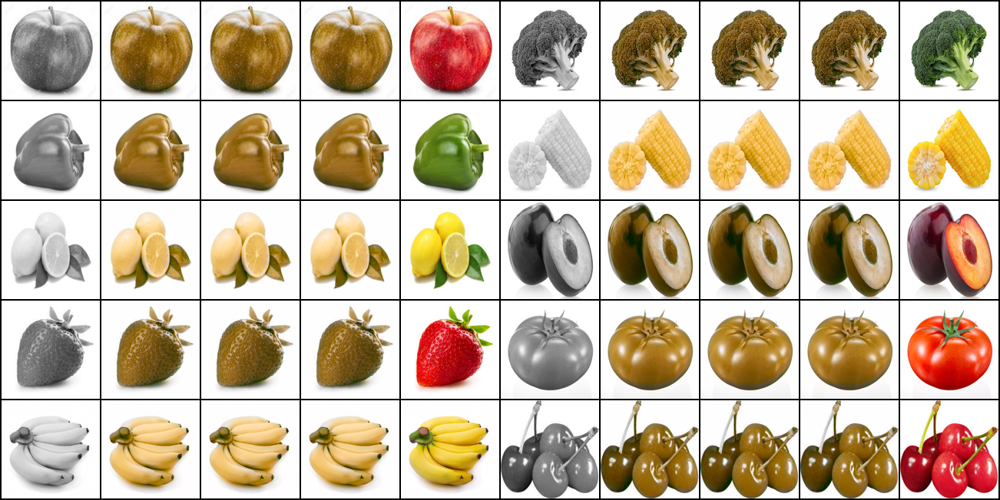

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

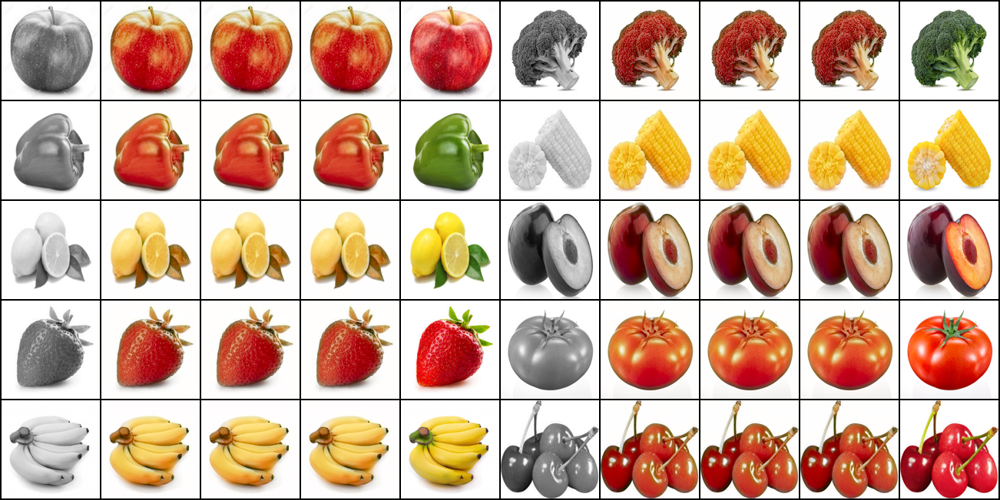

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

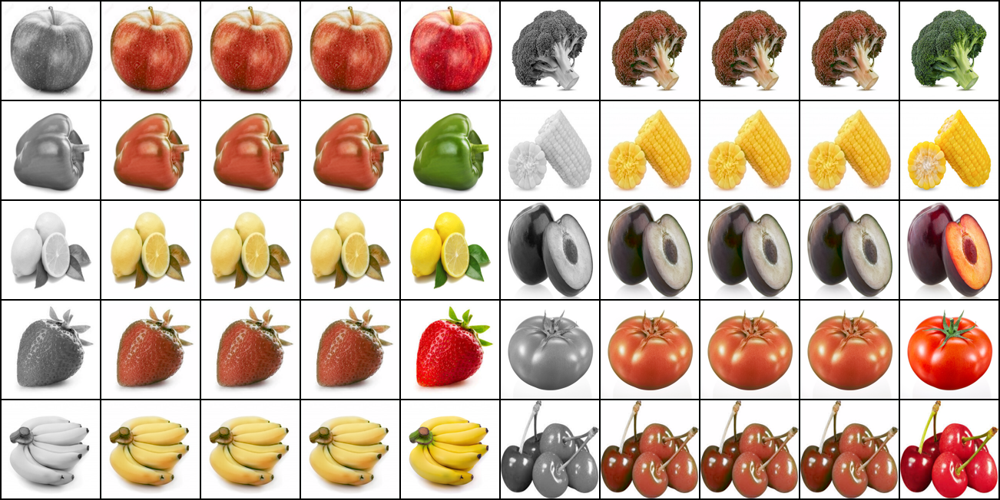

Level 1 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

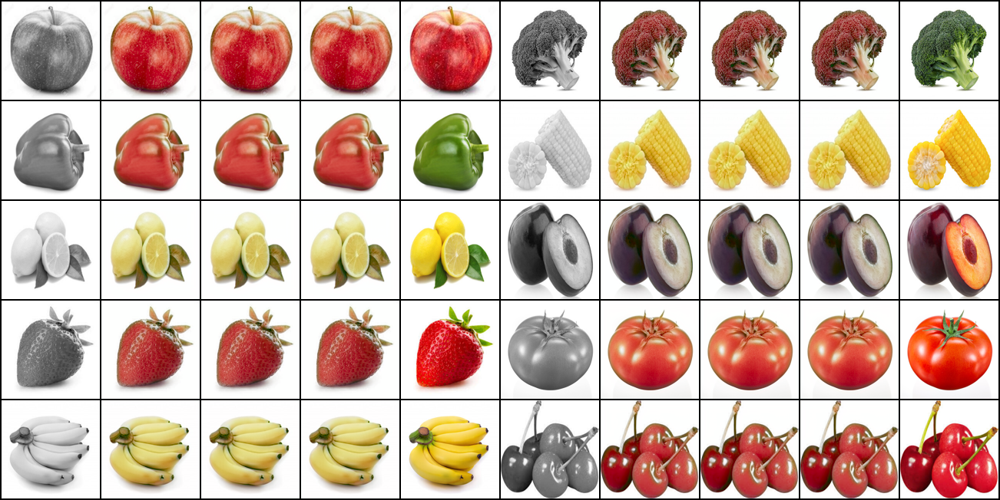

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

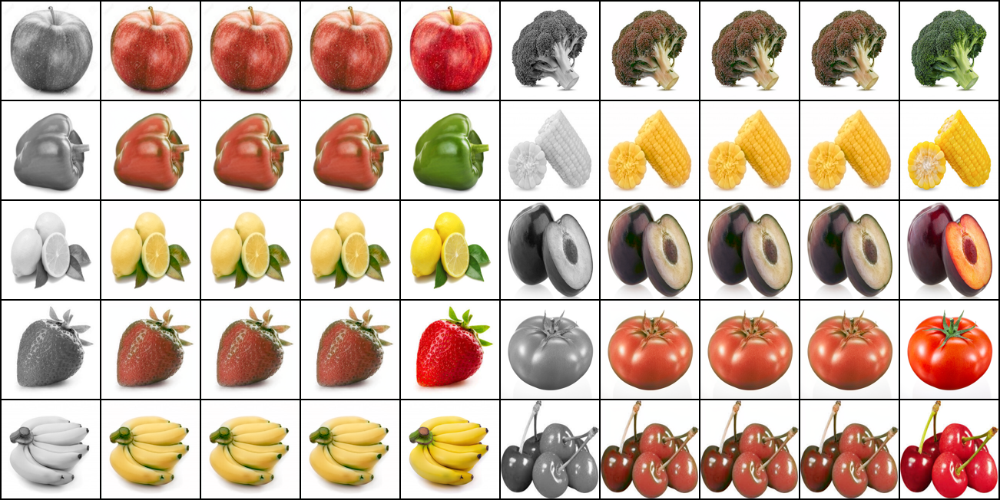

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

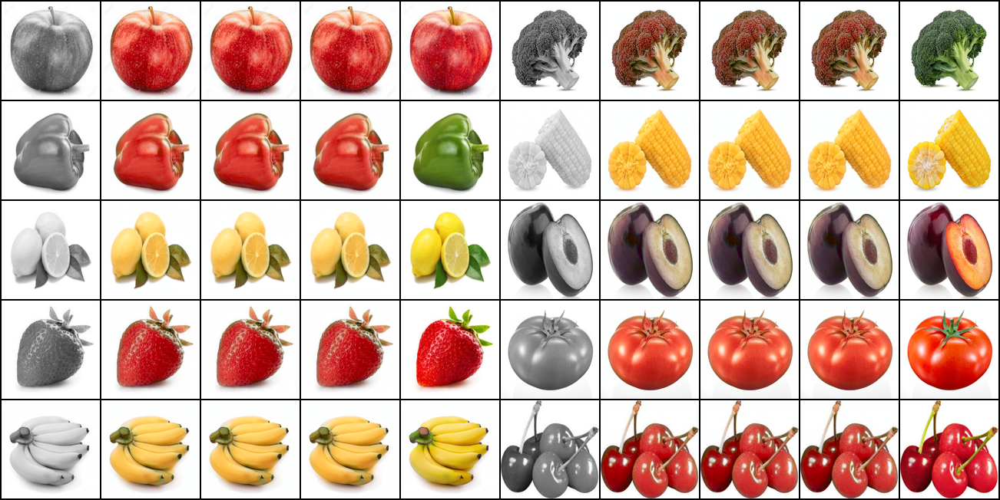

Level 1 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

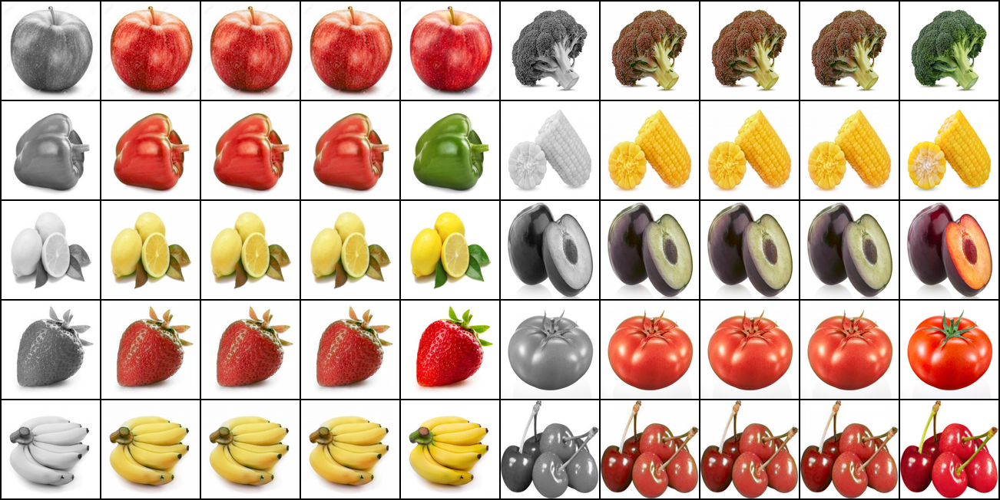

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

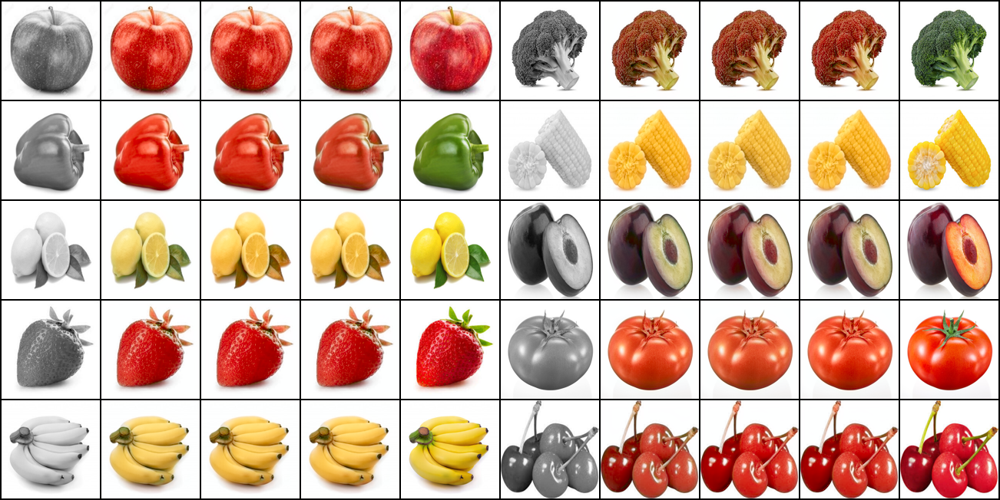

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

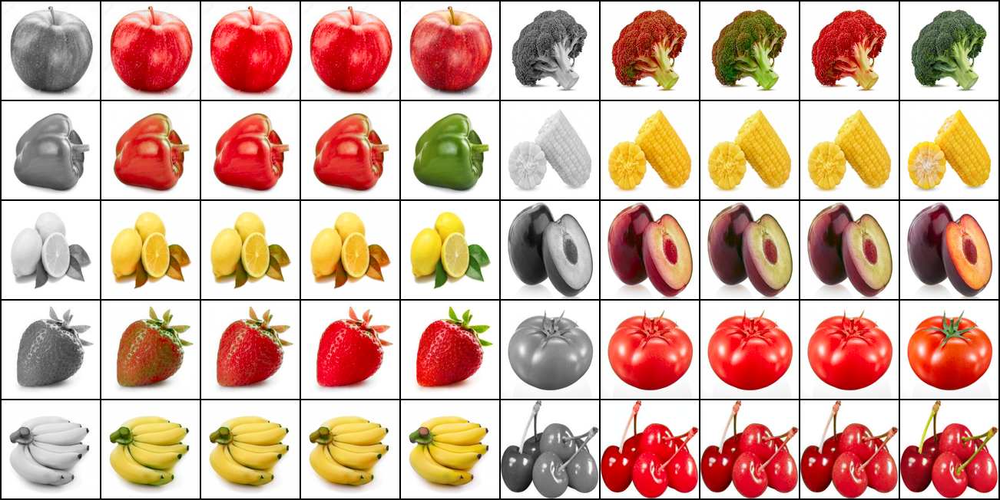

Level 1 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

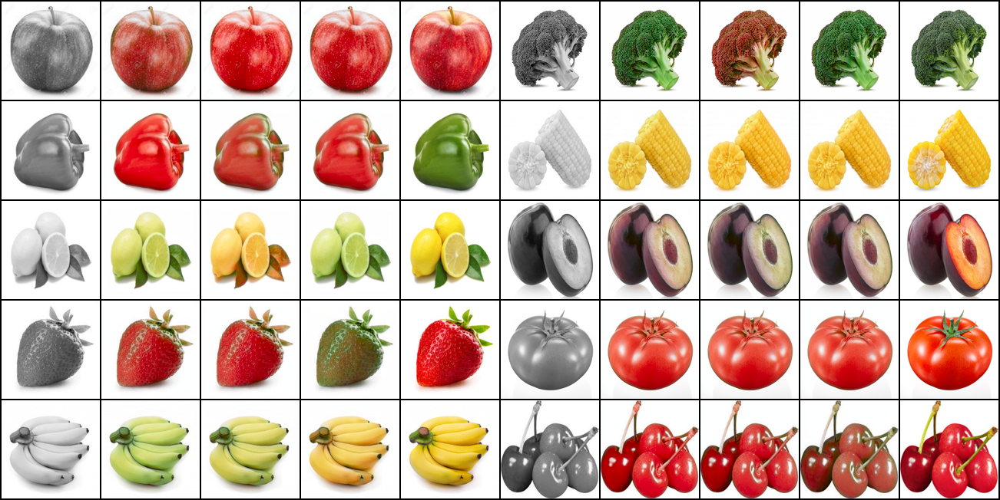

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

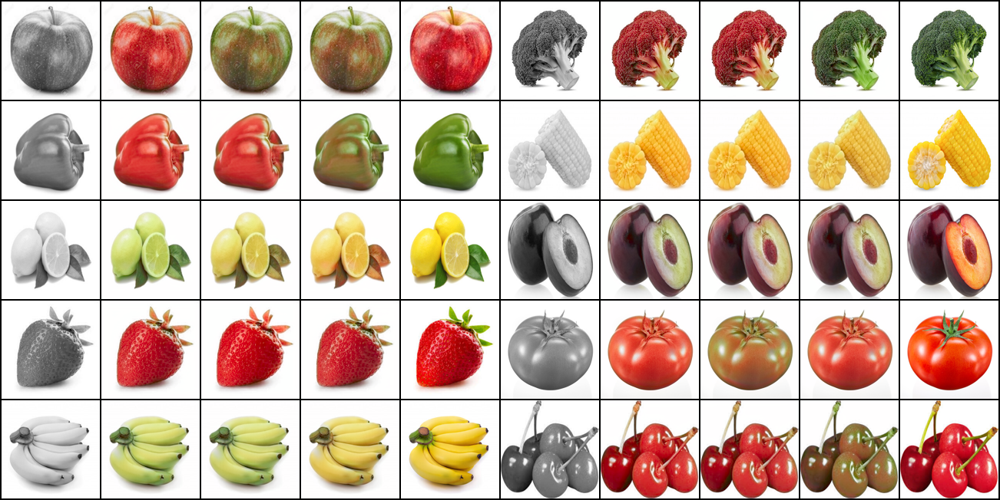

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

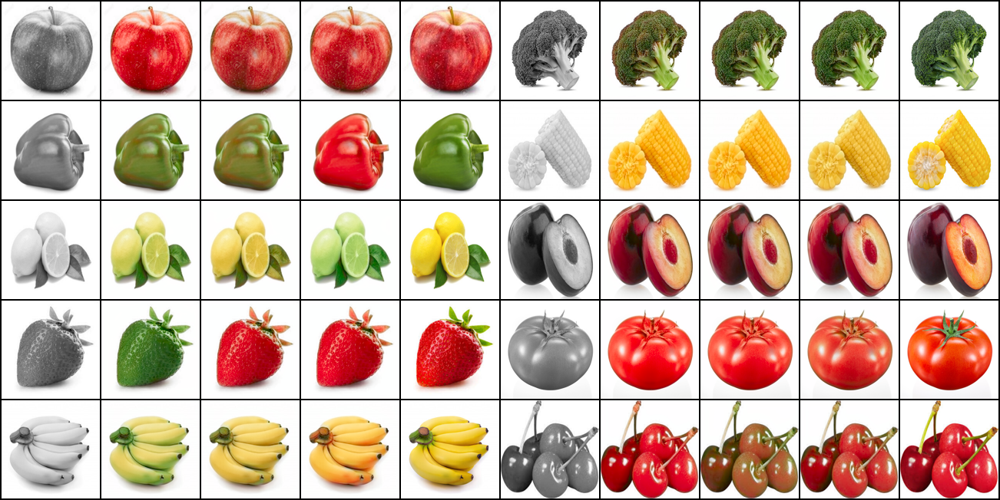

Level 1 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 1 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 2 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling outer loop:   0%|          | 0/6 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Level 3 Sampling inner loop:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

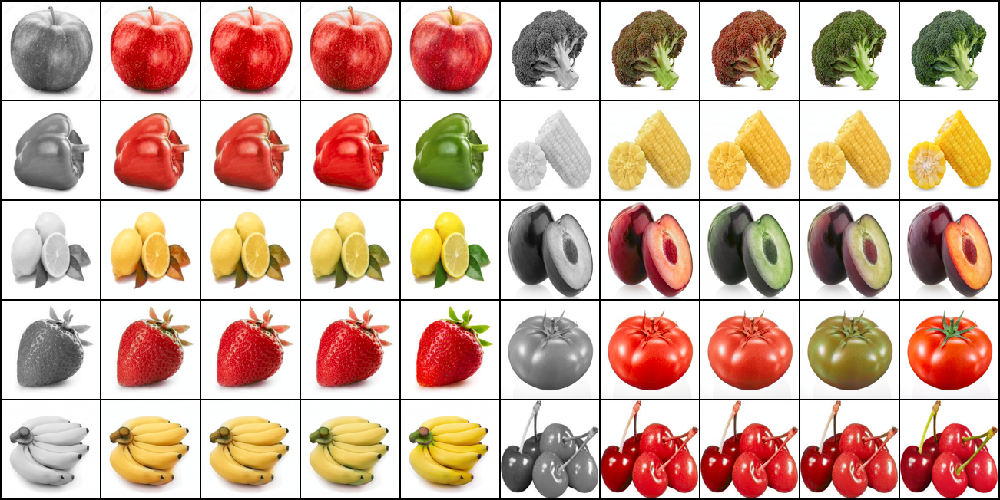

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

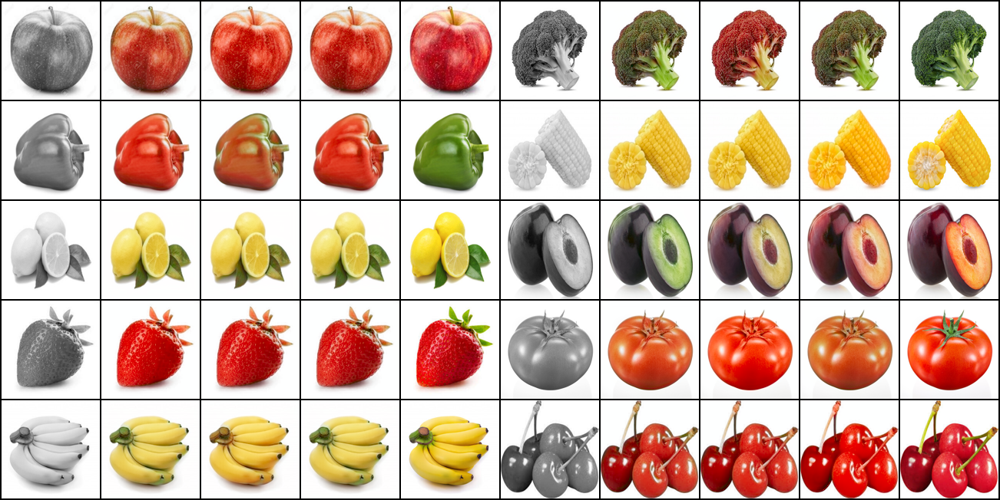

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Batches: 0it [00:00, ?it/s]

Evaluate: 0it [00:00, ?it/s]

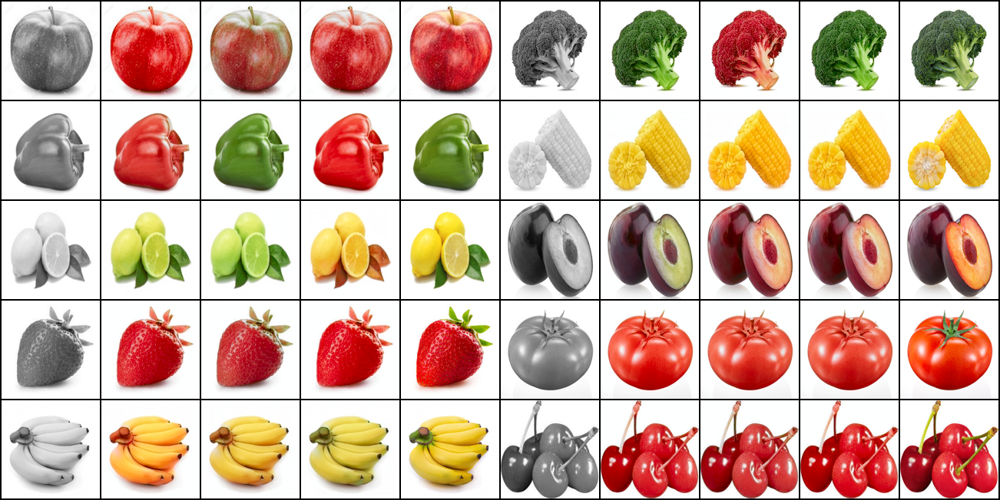

In [ ]:
#@title Training Code (double click to expand or collapse). 

import torchvision
from torchvision.utils import make_grid


# Visualize the model outputs
def evaluate(model, dataset, code_nc, L, num_samples=3):
    with torch.no_grad():
        loader = DataLoader(dataset, shuffle=False, pin_memory=True, 
                            batch_size=1)
        plot_images = []
        for idx, data in tqdm(enumerate(loader), desc="Evaluate", 
                            dynamic_ncols=True):
        
            xs = [x.to(device, non_blocking=True).expand(num_samples, -1, -1, -1) for x in data['network_input']]
            zs = [torch.randn(num_samples, code_nc, device=device) for _ in range(L)]

            outputs = model(xs, zs)
            rgb_out = lab2rgb_tensor(outputs[-1]).cpu().clamp_(*(0, 1))
            # each group contains: 1 input image, 3 random samples from the model and 1 observed image
            plot_images.append(data['network_input'][-1].expand(-1, 3, -1, -1))
            plot_images.append(rgb_out)
            plot_images.append(data['y3'])
        Grid = make_grid(torch.cat(plot_images, dim=0), nrow=10)
    
        # display result
        img = torchvision.transforms.ToPILImage()(Grid)
        display(img)


# initialize model and datasets
code_nc = 128
L = 3
# number of generated samples per input at each resolution used for CHIMLE
k = 10#@param {'type':'integer'}
model = TIM(in_nc=1, code_nc=code_nc, out_nc=2, 
            num_residual_channels=[32, 32, 32], 
            num_dense_channels=[32, 32, 32], 
            num_blocks=3, num_levels=L).to(device)
train_set = ColourizationDataset("./NCD_128/NCD_train_128.lmdb")
val_set = ColourizationDataset("./NCD_128/NCD_val_128.lmdb")
# initialize optimizer, the learning rate for the mapping network parameters is smaller
map_network_params = []
core_network_params = []
for key, val in model.named_parameters():
    if 'map' in key:
        map_network_params.append(val)
    else:
        core_network_params.append(val)
lr = 1e-4#@param {'type':'number'}
optimizer = torch.optim.Adam([{'params': core_network_params},
                              {'params': map_network_params, 'lr': 1e-2 * lr}],
                             lr=lr, weight_decay=0, betas=(0.9, 0.999))
loss_fn = nn.L1Loss(reduction='none').to(device)
# number of times to select new latent codes for training
num_rounds = 5#@param {'type':'integer'}
# number of epochs to train on a set of selected latent codes
epochs_per_round = 10#@param {'type':'integer'}
# size of mini-batch
batch_size = 4#@param {'type':'integer'}
# number of epoch to evaluate the model
eval_epochs = 5#@param {'type':'integer'}
for round in tqdm(range(num_rounds), dynamic_ncols=True, desc="Rounds"):
    # find the best latent codes for each conditioning input
    # for details of the procedure, please see above "CHIMLE Implementation" 
    round_dataset = ImageLatentDataset.get_image_latent_dataset(
            model=model,
            loss_fn=loss_fn,
            dataset=train_set,
            code_nc=code_nc,
            L=L,
            k=k)
    loader = DataLoader(round_dataset, shuffle=True, pin_memory=True, 
                        batch_size=batch_size)
    for epoch in tqdm(range(epochs_per_round), dynamic_ncols=True, desc="Epochs"):
        for idx,(xs,zs,y) in tqdm(enumerate(loader), desc="Batches", 
                                dynamic_ncols=True):
            xs = [x.to(device, non_blocking=True) for x in xs]
            zs = [z.to(device, non_blocking=True) for z in zs]
            y = y.to(device, non_blocking=True)

            outputs = model(xs, zs)
            rgb_out = lab2rgb_tensor(outputs[-1])
            loss = loss_fn(rgb_out, y).mean()
            loss.backward()
            optimizer.step()
            optimizer.zero_grad(set_to_none=True)
            
        if epoch % eval_epochs == 0 or epoch == (epochs_per_round - 1):
            evaluate(model, val_set, code_nc, L)

